In [6]:
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import cartopy.feature as cfeat
import cartopy.crs as ccrs
import seaborn as sns

In [7]:
area = xr.open_mfdataset("D:/UGP/datasets/adaptor.mars.internal-1619680920.0424895-32270-20-0420d0f4-ee7f-4ae8-8dc7-a2f3521f9cba.nc")
#.sel(lon = slice(50,110), lat = slice(40,-20),time = slice("2003-01-01" , "2019-12-31")).transpose()
area

<xarray.Dataset>
Dimensions:    (latitude: 241, longitude: 241, time: 204)
Coordinates:
  * longitude  (longitude) float32 50.0 50.25 50.5 50.75 ... 109.5 109.75 110.0
  * latitude   (latitude) float32 40.0 39.75 39.5 39.25 ... -19.5 -19.75 -20.0
  * time       (time) datetime64[ns] 2003-01-01 2003-02-01 ... 2019-12-01
Data variables:
    e          (time, latitude, longitude) float32 dask.array<chunksize=(204, 241, 241), meta=np.ndarray>
Attributes:
    Conventions:  CF-1.6
    history:      2021-04-29 07:22:59 GMT by grib_to_netcdf-2.16.0: /opt/ecmw...

In [8]:
def make_figure():
    fig = plt.figure(figsize=(8, 4))
    ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

    # generate a basemap with country borders, oceans and coastlines
    ax.add_feature(cfeat.LAND)
    ax.add_feature(cfeat.OCEAN)
    ax.add_feature(cfeat.COASTLINE)
    ax.add_feature(cfeat.BORDERS, linestyle='dotted')
    return fig, ax

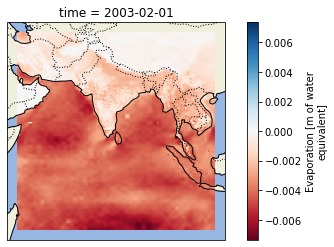

In [10]:
_, ax = make_figure()
grid = area.isel(time=1).e
grid.plot(ax=ax, transform=ccrs.PlateCarree(), cmap = "RdBu")

In [122]:
fig, ax = make_figure()

frames = area.time.size                      # Number of frames
min_value = float(area.precip.min().values)  # Lowest value
max_value = float(area.precip.max().values)  # Highest value

def draw(frame, add_colorbar):
    grid = area.isel(time=frame).precip
    contour = grid.plot(ax=ax, transform=ccrs.PlateCarree(),add_colorbar=add_colorbar, vmin=min_value, vmax=max_value , cmap = "Blues")
    title = "Time - " + str(grid.time.values)
    ax.set_title(title)
    return contour


def init():
    return draw(0, add_colorbar=True)


def animate(frame):
    return draw(frame, add_colorbar=False)


ani = animation.FuncAnimation(fig, animate, frames, interval=0.01, blit=False,init_func=init, repeat=False)
plt.close(fig)

In [ ]:
ani.save('era5.mp4', writer=animation.FFMpegWriter(fps=5))